# Deep Learning Methodology

Desigining a model and input pipeline for the data

## Pure UNet Method

#### Import libraries

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pymeanshift as pms
import seaborn as sns
import csv
import random
import time
import pandas as pd
import seaborn as sns

from ipyfilechooser import FileChooser
from tensorflow import keras
from keras import layers
from tqdm import tqdm

from baseline import baseline_mean_shift_third
from datamaker import make_image_csv, make_image_csv_bd, check_for_corrupted_files

from constants import DATASET_FOLDER

Config

In [2]:
tf.config.list_physical_devices('GPU')
fc = FileChooser(DATASET_FOLDER)
model_file = FileChooser('models')

#### Shuffle

In [8]:
def shuffle_csv(file_path):
    with open(file_path, 'r') as file:
        reader = csv.reader(file)
        header = next(reader)
        rows = list(reader)
    random.shuffle(rows)
    with open(file_path, 'w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(header)
        writer.writerows(rows)

shuffle_csv("image_paths.csv")
shuffle_csv("image_paths_bd.csv")

#### Dataset Creation

In [9]:
def load_image(image_path, label_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [256, 256], method='nearest')
    image = tf.image.convert_image_dtype(image, tf.float32)

    label = tf.io.read_file(label_path)
    label = tf.image.decode_png(label, channels=1)
    label = tf.image.resize(label, [256, 256], method='nearest')
    label = tf.image.convert_image_dtype(label, tf.float32)

    return image, label

def load_dataset(csv_file):
    dataset = tf.data.experimental.CsvDataset(
        csv_file,
        [tf.string, tf.string],
        header=True,
        field_delim=','
    )
    dataset = dataset.map(load_image)
    return dataset

dataset = load_dataset("image_paths.csv")

In [10]:
dataset.prefetch(tf.data.experimental.AUTOTUNE)
dataset.cache('cache/dataset.cache')

<CacheDataset element_spec=(TensorSpec(shape=(256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(256, 256, 1), dtype=tf.float32, name=None))>

#### Sanity Check

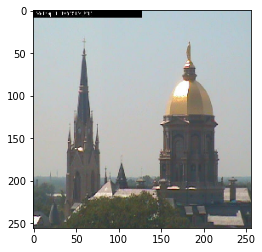

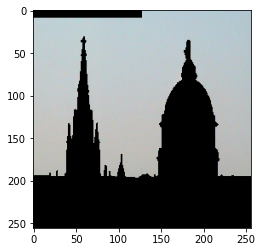

In [11]:
for image, label in dataset.take(1):
    image_masked = image * label # type: ignore
    plt.imshow(image)
    plt.show()
    plt.imshow(image_masked)
    plt.show()

#### Model

In [12]:
def unet_model(input_shape=(256, 256, 3)):
    inputs = keras.Input(shape=input_shape)
    x = inputs

    # Down-sampling through the model
    skips = []
    for filters in [64, 128, 256]:
        x = layers.Conv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

        skips.append(x)
        x = layers.MaxPooling2D(2)(x)

    # Bottleneck
    x = layers.Conv2D(512, 3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    # Up-sampling through the model
    for filters, skip in reversed(list(zip([256, 128, 64], skips))):
        x = layers.UpSampling2D(2)(x)
        x = layers.Concatenate()([x, skip])
        x = layers.Conv2D(filters, 3, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

    # Final layer
    outputs = layers.Conv2D(1, 1)(x)
    outputs = layers.Activation('sigmoid')(outputs)

    return keras.Model(inputs=inputs, outputs=outputs)

#### Dataset Split

In [13]:
#add extra dimension to the dataset
train_dataset = dataset.take(30000).map(lambda x,y: (tf.expand_dims(x,axis=0), tf.expand_dims(y,axis=0)))
val_dataset = dataset.skip(30000).take(2000).map(lambda x,y: (tf.expand_dims(x,axis=0), tf.expand_dims(y,axis=0)))
test_dataset = dataset.skip(32000).take(6000).map(lambda x,y: (tf.expand_dims(x,axis=0), tf.expand_dims(y,axis=0)))

#### Manual Hyperparameter Tuning and GridSearch

Model Definition with configurable hyperparameters

In [14]:
def unet_model_grid_search(input_shape=(256, 256, 3), filters=32, kernel_size=7, padding='same', learning_rate=0.001, loss='binary_crossentropy', optimizer=keras.optimizers.SGD):
    inputs = keras.Input(shape=input_shape)
    x = inputs

    # Down-sampling through the model
    skips = []
    for filter_size in [filters, filters*2, filters*4]:
        x = layers.Conv2D(filter_size, kernel_size, padding=padding)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

        skips.append(x)
        x = layers.MaxPooling2D(2)(x)

    # Bottleneck
    x = layers.Conv2D(filters*8, kernel_size, padding=padding)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation("relu")(x)

    # Up-sampling through the model
    for filter_size, skip in reversed(list(zip([filters*4, filters*2, filters], skips))):
        x = layers.UpSampling2D(2)(x)
        x = layers.Concatenate()([x, skip])
        x = layers.Conv2D(filter_size, kernel_size, padding=padding)(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)

    # Final layer
    outputs = layers.Conv2D(1, 1)(x)
    outputs = layers.Activation('sigmoid')(outputs)

    model = keras.Model(inputs=inputs, outputs=outputs)

    # Compile the model
    model.compile(optimizer=optimizer(learning_rate=learning_rate), loss=loss, metrics=[tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

    return model

Hyperparameter Test Execution

Note: Do not execute, since this will take a long time

In [8]:
filters = [32, 64]
kernel_sizes = [3, 5, 7]
paddings = ['same']
learning_rates = [0.001, 0.0001]
losses = ['binary_crossentropy', 'mean_squared_error']
optimizers = [keras.optimizers.Adam, keras.optimizers.SGD]

for filter in filters:
    for kernel_size in kernel_sizes:
        for padding in paddings:
            for learning_rate in learning_rates:
                for loss in losses:
                    for optimizer in optimizers:
                        grid_search_model = unet_model_grid_search(filters=filter, 
                                               kernel_size=kernel_size, 
                                               padding=padding, 
                                               learning_rate=learning_rate, 
                                               loss=loss, 
                                               optimizer=optimizer)
                        grid_search_model.fit(train_dataset.take(10000), epochs=1, validation_data=val_dataset, use_multiprocessing=True, workers=4, shuffle=True)
                        #save the metrics of the model into a dataframe and save it to a csv file
                        df = pd.DataFrame({
                            'filters': [filter],
                            'kernel_size': [kernel_size],
                            'padding': [padding],
                            'learning_rate': [learning_rate],
                            'loss_class': [loss],
                            'loss': [loss],
                            'optimizer': [optimizer],
                            **grid_search_model.history.history
                        })
                        df.to_csv('grid_search_results.csv', mode='a', header=False, index=False)

10000/10000 [==============================] - 1999s 200ms/step - loss: 0.0493 - precision_7: 0.9201 - recall_7: 0.9529 - val_loss: 0.0363 - val_precision_7: 0.9516 - val_recall_7: 0.9539


Use the following code to view the generate data

In [4]:
#import the csv file with the results of the grid search
grid_search_results = pd.read_csv('output\\analysis_data\\grid_search_results.csv')

#show the best precision and recall
grid_search_results.sort_values(by=['val_precision', 'val_recall'], ascending=False).head(10)

,filters,kernel_size,padding,learning_rate,loss_class,loss,optimizer,train_precision,train_recall,val_loss,val_precision,val_recall
17,32,7,same,0.0010,binary_crossentropy,0.078467,<class 'keras.optimizers.optimizer_v2.gradient...,0.968711,0.976942,0.116880,0.979050,0.928559
38,64,5,same,0.0001,mean_squared_error,0.015297,<class 'keras.optimizers.optimizer_v2.adam.Adam'>,0.975060,0.982642,0.018864,0.976575,0.971352
24,64,3,same,0.0010,binary_crossentropy,0.080161,<class 'keras.optimizers.optimizer_v2.adam.Adam'>,0.963641,0.975450,0.104012,0.971107,0.955492
0,32,3,same,0.0010,binary_crossentropy,0.074132,<class 'keras.optimizers.optimizer_v2.adam.Adam'>,0.967016,0.976584,0.096737,0.970665,0.960442
26,64,3,same,0.0010,mean_squared_error,0.020821,<class 'keras.optimizers.optimizer_v2.adam.Adam'>,0.965951,0.976806,0.024705,0.970508,0.960369
44,64,7,same,0.0001,binary_crossentropy,0.059708,<class 'keras.optimizers.optimizer_v2.adam.Adam'>,0.972973,0.981287,0.077808,0.968929,0.972551
18,32,7,same,0.0010,mean_squared_error,0.020504,<class 'keras.optimizers.optimizer_v2.adam.Adam'>,0.965254,0.977911,0.032207,0.967926,0.941859
33,64,5,same,0.0010,binary_crossentropy,0.073386,<class 'keras.optimizers.optimizer_v2.gradient...,0.968502,0.978329,0.089794,0.967280,0.967429
32,64,5,same,0.0010,binary_crossentropy,0.081922,<class 'keras.optimizers.optimizer_v2.adam.Adam'>,0.962747,0.975148,0.172997,0.966842,0.897641
14,32,5,same,0.0001,mean_squared_error,0.014486,<class 'keras.optimizers.optimizer_v2.adam.Adam'>,0.976593,0.983624,0.017983,0.966750,0.984268


#### Final Model Training

The optimized values are set as default values for the model

In [12]:
# Create a UNET model
model = unet_model_grid_search()

# Define a callback to save the model after each epoch
checkpoint_callback = keras.callbacks.ModelCheckpoint(
    "models/model_30000_5_optimized.h5", save_freq="epoch"
)

# Train the model on the dataset
model.fit(train_dataset, epochs=5, callbacks=[checkpoint_callback], validation_data=val_dataset, use_multiprocessing=True, workers=4, shuffle=True) 

Epoch 1/5
30000/30000 [==============================] - 1875s 62ms/step - loss: 0.0501 - precision: 0.9797 - recall: 0.9847 - val_loss: 0.0713 - val_precision: 0.9689 - val_recall: 0.9802
Epoch 2/5
30000/30000 [==============================] - 1862s 62ms/step - loss: 0.0236 - precision: 0.9908 - recall: 0.9919 - val_loss: 0.0708 - val_precision: 0.9660 - val_recall: 0.9852
Epoch 3/5
30000/30000 [==============================] - 1858s 62ms/step - loss: 0.0177 - precision: 0.9930 - recall: 0.9936 - val_loss: 0.0743 - val_precision: 0.9649 - val_recall: 0.9863
Epoch 4/5
30000/30000 [==============================] - 1852s 62ms/step - loss: 0.0146 - precision: 0.9942 - recall: 0.9946 - val_loss: 0.0722 - val_precision: 0.9664 - val_recall: 0.9869
Epoch 5/5
30000/30000 [==============================] - 1838s 61ms/step - loss: 0.0126 - precision: 0.9949 - recall: 0.9952 - val_loss: 0.0697 - val_precision: 0.9677 - val_recall: 0.9875


: 

In [15]:
#import the model
model = keras.models.load_model('models/model_30000_5_optimized.h5')

#perform inference on the test dataset
model.evaluate(test_dataset, use_multiprocessing=True, workers=4)

#print the model summary
model.summary()

6000/6000 [==============================] - 209s 29ms/step - loss: 0.0638 - precision: 0.9703 - recall: 0.9879
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 32  4736        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 32  128        ['conv2d[0][0]']

### Prediction on Test Dataset

#### Perform Prediciton on Test Dataset and show the lowest performing images

It displays all images that have precision and recall lower than 0.2

In [16]:
model_results = []
model = keras.models.load_model("models/model_30000_5_optimized.h5")

sns.set_style("white")
sns.set_context("paper", font_scale=1)

for image, label in tqdm(test_dataset):#.map(lambda x,y: (tf.expand_dims(x,axis=0), tf.expand_dims(y,axis=0))):
    #image = tf.expand_dims(image, axis=0)
    start = time.time()
    prediction = model.predict(image, verbose = 0) # remove first dimension of prediction tensor
    time_taken = time.time() - start

    #get the precision and recall
    precision = tf.keras.metrics.Precision()
    precision.update_state(label, prediction)
    recall = tf.keras.metrics.Recall()
    recall.update_state(label, prediction)

    #if precision and recall are less than 0.5, display the image
    if precision.result().numpy() < 0.2:
        print("Precision: ", precision.result().numpy())
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image[0])
        ax1.set_title('Original Image with low Precision')
        ax2.imshow(prediction[0])
        ax2.set_title('Predicted Mask with low Precision')
        plt.show()

    if recall.result().numpy() < 0.2:
        print("Recall: ", recall.result().numpy())
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image[0])
        ax1.set_title('Original Image with low Recall')
        ax2.imshow(prediction[0])
        ax2.set_title('Predicted Mask with low Recall')
        plt.show()

    model_results.append([precision.result().numpy(), recall.result().numpy(), time_taken])
    #save results to csv with headers
np.savetxt("output\\analysis_data\\results_6000_5_model.csv", model_results, delimiter=",", header="precision,recall,time_taken", comments="")

0it [00:00, ?it/s]

#### Use the Baseline Model to predict on the Test Dataset

In [42]:
baseline_results = []

sns.set_style("white")
sns.set_context("paper", font_scale=1)

for image, label in tqdm(test_dataset):
    start = time.time()
    
    # convert the image to a numpy array of 256x256x3 of type uint8
    image = tf.image.convert_image_dtype(tf.squeeze(image, axis=0), tf.uint8).numpy()
    label = tf.image.convert_image_dtype(tf.squeeze(label, axis=0), tf.uint8).numpy()

    mask, segmented_image, labels_image = baseline_mean_shift_third(image)
    time_taken = time.time() - start

    #get the precision and recall
    precision = tf.keras.metrics.Precision()
    precision.update_state(label, mask)
    recall = tf.keras.metrics.Recall()
    recall.update_state(label, mask)

    baseline_results.append([precision.result().numpy(), recall.result().numpy(), time_taken])

np.savetxt("output\\analysis_data\\results_6000_5_baseline.csv", baseline_results, delimiter=",", header="precision,recall,time_taken", comments="")

6000it [09:40, 10.34it/s]


#### Plot the distribution of both models

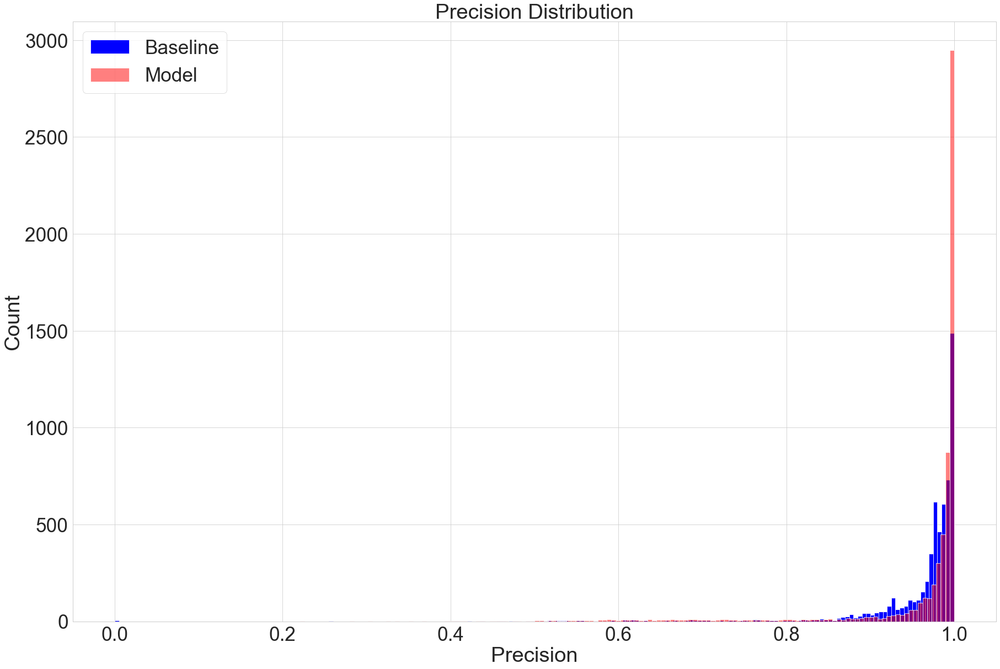

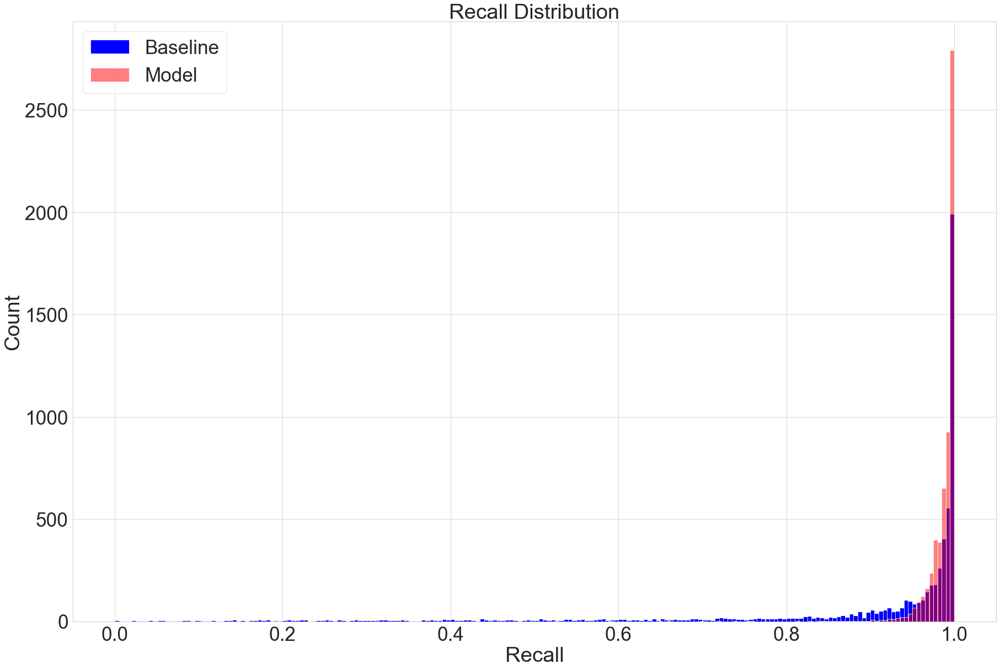

In [3]:
# Read the data from the CSV files
df1 = pd.read_csv("output\\analysis_data\\results_6000_5_model.csv")
df2 = pd.read_csv("output\\analysis_data\\results_6000_5_baseline.csv")

# Set the style for the plots
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=4)

# Create a figure with a single subplot
fig, ax = plt.subplots(figsize=(30, 20))

# Plot the distribution of precision values for df2 in blue
sns.histplot(df2['precision'], ax=ax, color='blue', alpha=1, label='Baseline', bins=200)

# Plot the distribution of precision values for df1 in red
sns.histplot(df1['precision'], ax=ax, color='red', alpha=0.5, label='Model', bins=145)

# Set the title and axis labels
ax.set_title("Precision Distribution")
ax.set_xlabel("Precision")
ax.set_ylabel("Count")

# Add a legend
ax.legend()

# Display the plot
plt.show()

# Set the font size for the plot
sns.set_context("paper", font_scale=4)

# Create a figure with a single subplot
fig, ax = plt.subplots(figsize=(30, 20))

# Plot the distribution of recall values for df2 in blue
sns.histplot(df2['recall'], ax=ax, color='blue', alpha=1, label='Baseline', bins=200)

# Plot the distribution of recall values for df1 in red
sns.histplot(df1['recall'], ax=ax, color='red', alpha=0.5, label='Model', bins=200)

# Set the title and axis labels
ax.set_title("Recall Distribution")
ax.set_xlabel("Recall")
ax.set_ylabel("Count")

# Add a legend
ax.legend()

# Display the plot
plt.show()

#### Average Metrics for UNet and Baseline Model

In [44]:
print("Mean Precision for Baseline", df2['precision'].mean())
print("Mean Recall for Baseline", df2['recall'].mean())
print("Mean Time Taken for Baseline", df2['time_taken'].mean())

Mean Precision for Baseline 0.9623993121067372
Mean Recall for Baseline 0.8992276021586925
Mean Time Taken for Baseline 0.0722687085866928


In [45]:
print("Mean Precision for Model", df1['precision'].mean())
print("Mean Recall for Model", df1['recall'].mean())
print("Mean Time Taken for Model", df1['time_taken'].mean())

Mean Precision for Model 0.9638832676460346
Mean Recall for Model 0.9869177937544106
Mean Time Taken for Model 0.07213534220059713


#### Display Results for the model

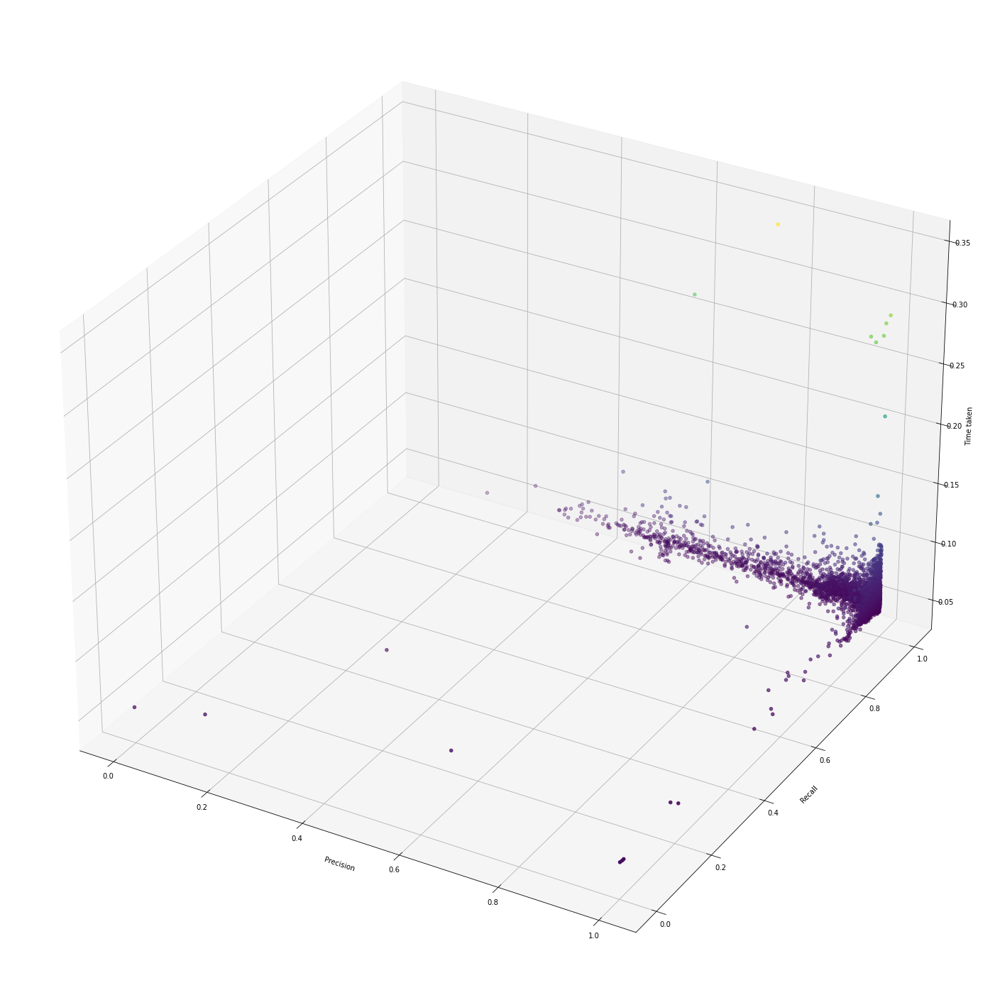

In [44]:
#plot results in a 3D graph
fig = plt.figure(figsize=(25, 30))
ax = fig.add_subplot(111, projection='3d')
results = np.array(model_results)
ax.scatter(results[:,0], results[:,1], results[:,2], c=results[:,2], cmap='viridis')
ax.set_xlabel('Precision')
ax.set_ylabel('Recall')
ax.set_zlabel('Time taken')
plt.show()

# Fine-Tuning with Bachelor Thesis Dataset

In [5]:
make_image_csv_bd(DATASET_FOLDER, "image_paths_bd.csv")
check_for_corrupted_files("image_paths_bd.csv")

IntProgress(value=0, max=62)

In [9]:
bachelor_dataset = load_dataset("image_paths_bd.csv")
bachelor_dataset.prefetch(tf.data.experimental.AUTOTUNE)
bachelor_dataset.cache('cache/dataset.cache')
bachelor_dataset = bachelor_dataset.map(lambda x,y: (tf.expand_dims(x,axis=0), tf.expand_dims(y,axis=0)))

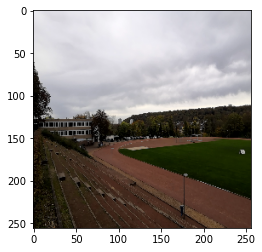

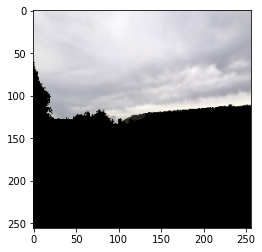

In [10]:
for image, label in bachelor_dataset.take(1):
    image_masked = image * label # type: ignore
    plt.imshow(image[0])
    plt.show()
    plt.imshow(image_masked[0])
    plt.show()

In [64]:
def unet_model_added(model_path, dataset, num_epochs, save_path):
    # Load the model
    model = keras.models.load_model(model_path)

    # Compile the model
    model.compile(optimizer="adam", loss="binary_crossentropy", metrics=[tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]) 

    # Train the model
    model.fit(dataset, epochs=num_epochs)

    # Save the model
    model.save(save_path)

In [93]:
epoch = 1
unet_model_added('models/model_30000_5_optimized.h5', bachelor_dataset, epoch, 'models/model_transfer_'+ str(epoch) +'.h5')

62/62 [==============================] - 4s 40ms/step - loss: 0.3517 - precision_12012: 0.9339 - recall_12012: 0.9102


#### Testing on the original dataset

Failure cases are printed below

Precision:  0.16032854


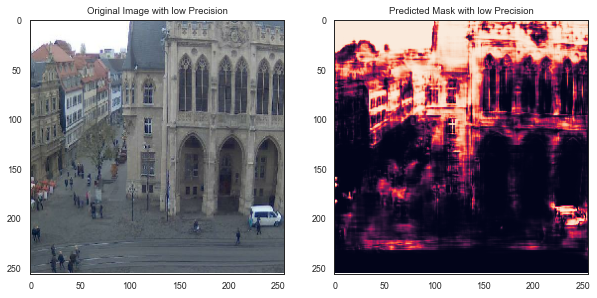

Precision:  0.16026363


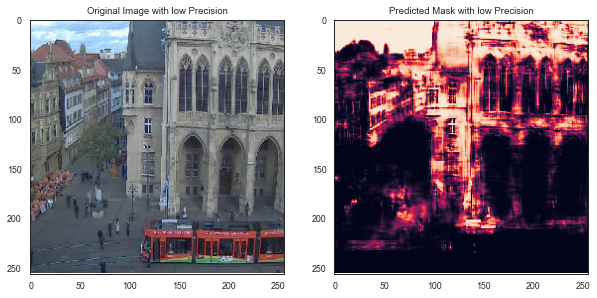

Precision:  0.18662953


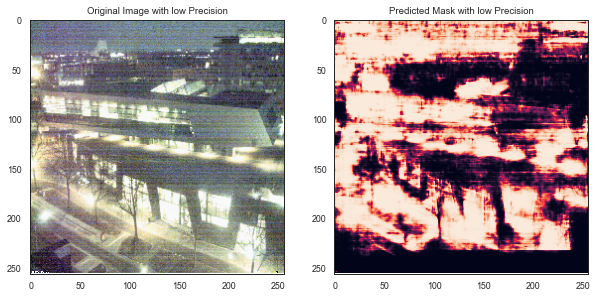

Precision:  0.19914635


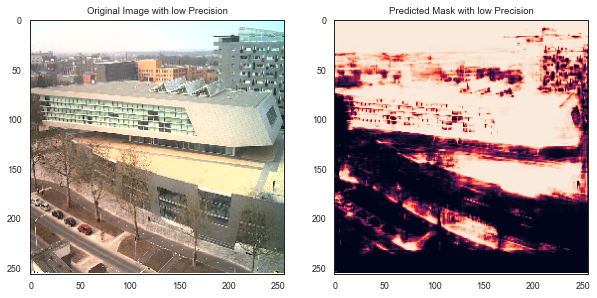

Precision:  0.1513158


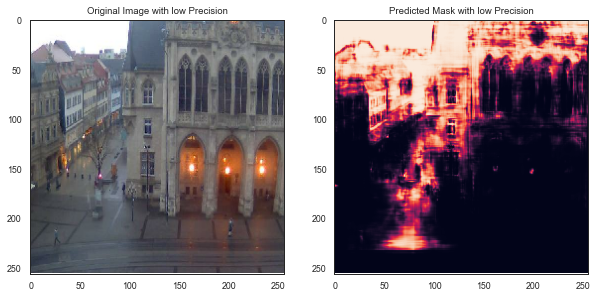

Precision:  0.15062629


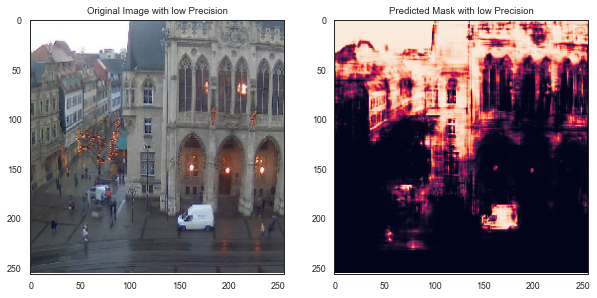

Precision:  0.0


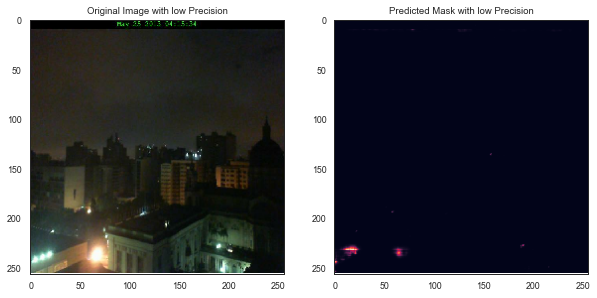

Recall:  0.0


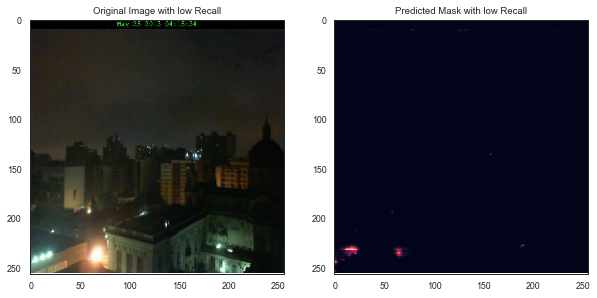

Precision:  0.116154


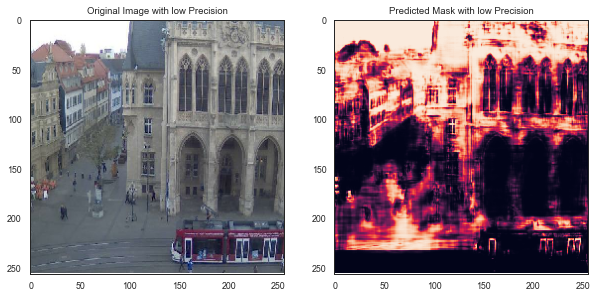

Precision:  0.19504856


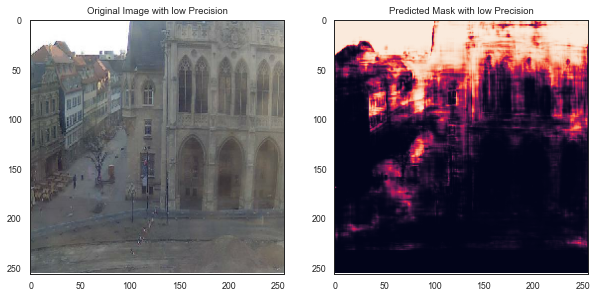

Recall:  0.006364534


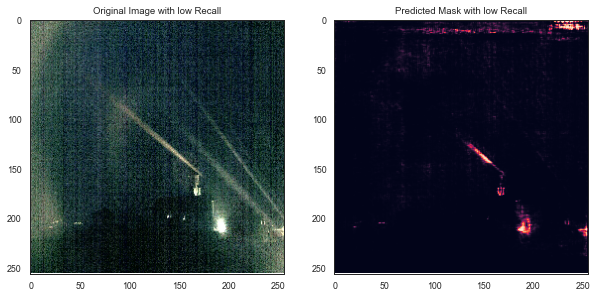

Precision:  0.0


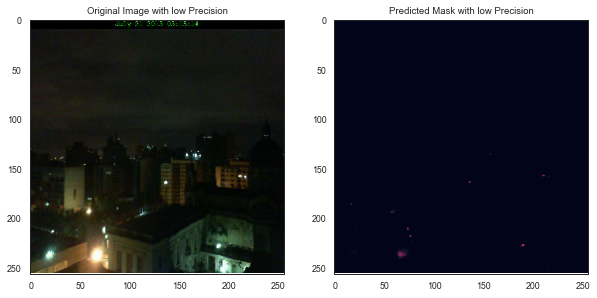

Recall:  0.0


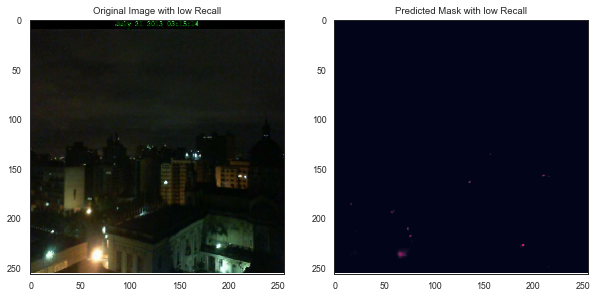

Precision:  0.11536748


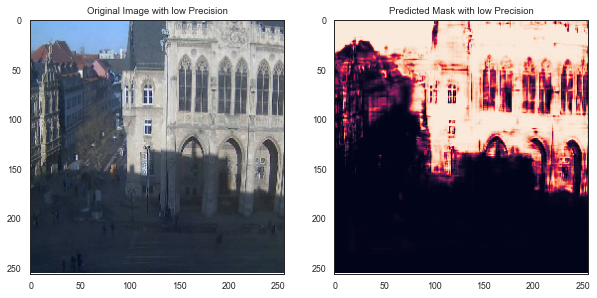

Precision:  0.106403686


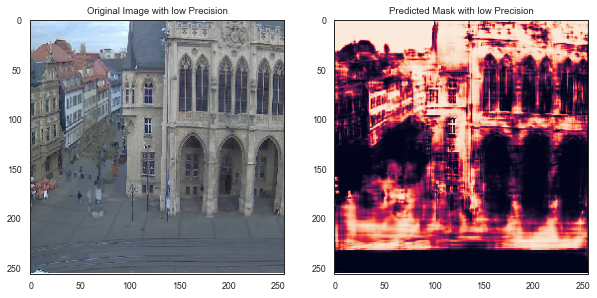

Precision:  0.15484011


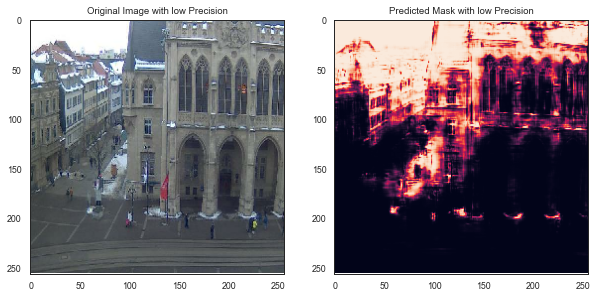

Recall:  0.019106127


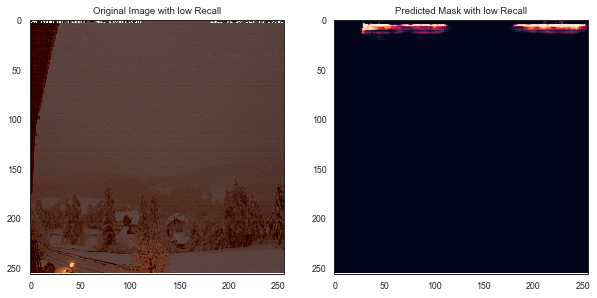

Precision:  0.11291472


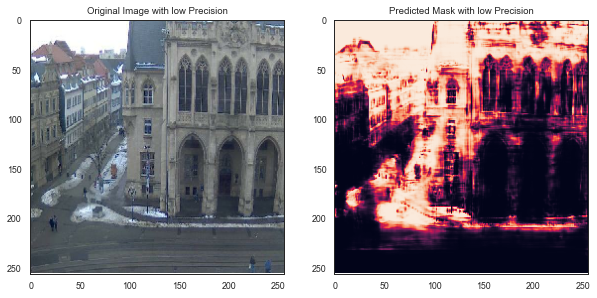

Precision:  0.12287278


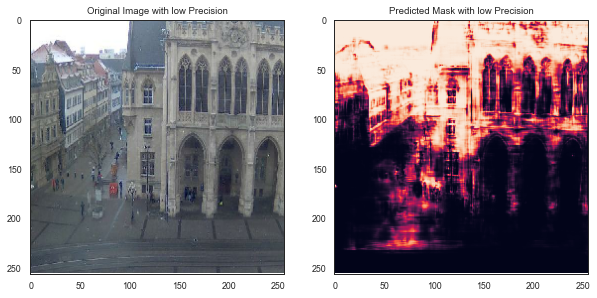

Precision:  0.12614962


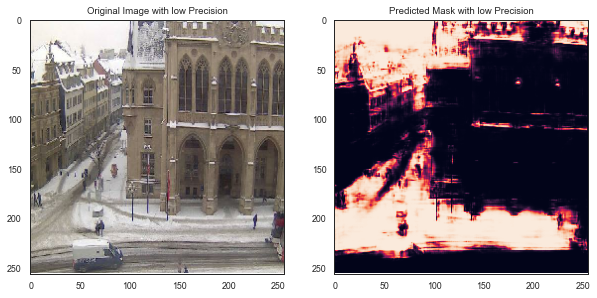

Precision:  0.077200204


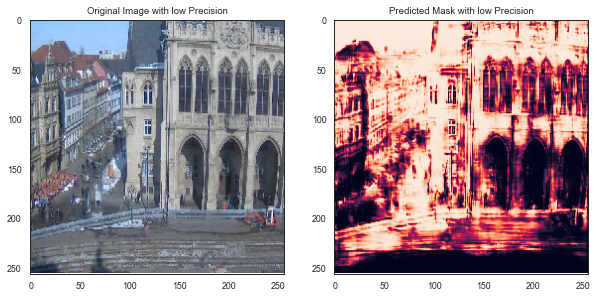

Precision:  0.16232213


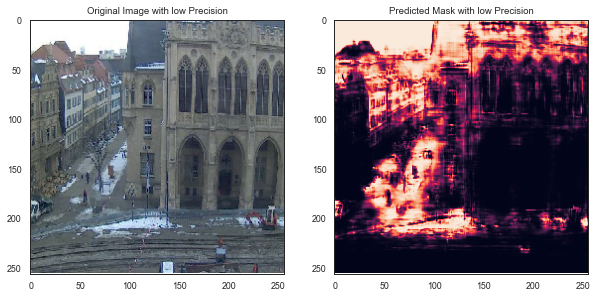

Precision:  0.14775671


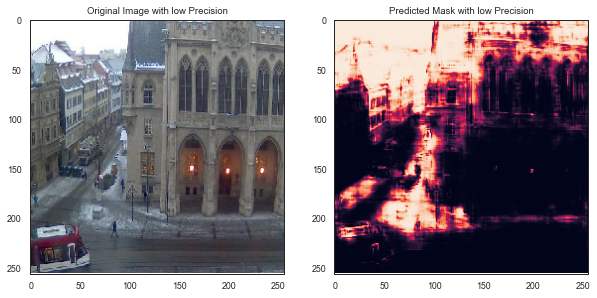

Precision:  0.065345265


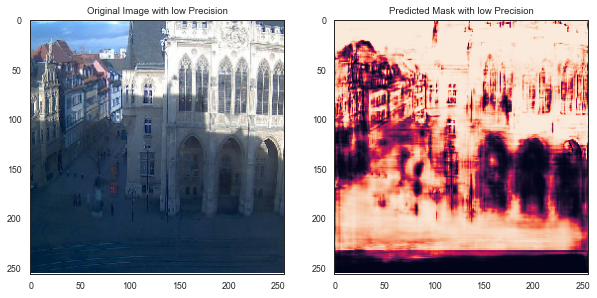

Precision:  0.17167054


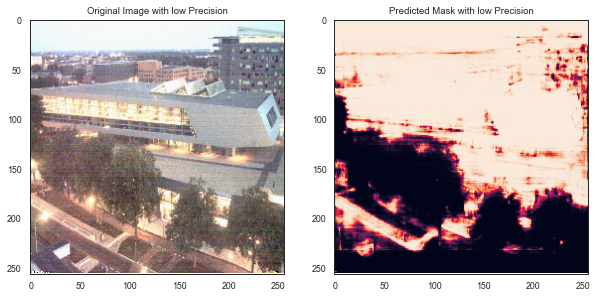

Precision:  0.17266056


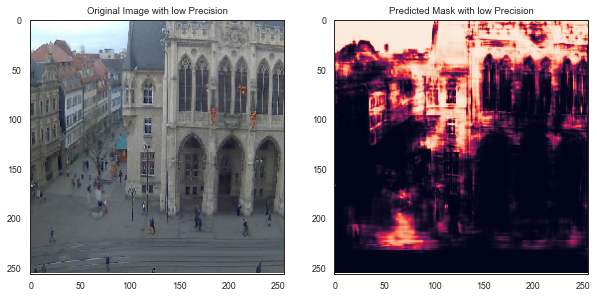

Precision:  0.19750692


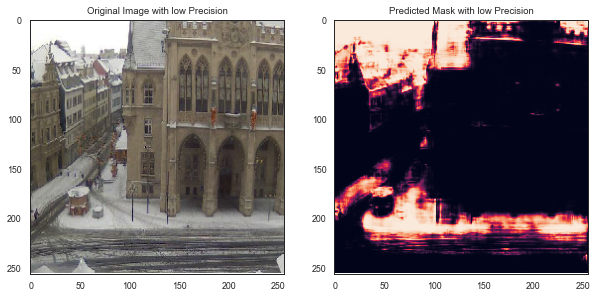

Precision:  0.14312957


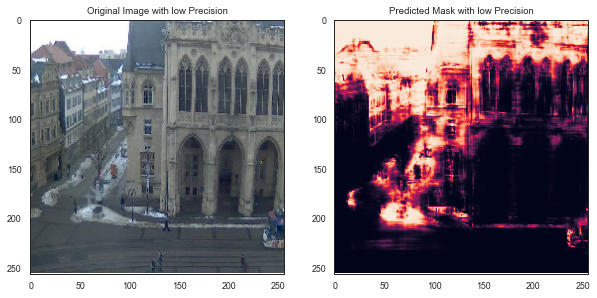

In [94]:
#predict on a single image from the dataset after skipping 10 images
transfer_results = []
model = keras.models.load_model("models/model_transfer_" + str(epoch) + ".h5")

sns.set_style("white")
sns.set_context("paper", font_scale=1)

for image, label in test_dataset:#.map(lambda x,y: (tf.expand_dims(x,axis=0), tf.expand_dims(y,axis=0))):
    #image = tf.expand_dims(image, axis=0)
    start = time.time()
    prediction = model.predict(image, verbose = 0) # remove first dimension of prediction tensor
    time_taken = time.time() - start

    #get the precision and recall
    precision = tf.keras.metrics.Precision()
    precision.update_state(label, prediction)
    recall = tf.keras.metrics.Recall()
    recall.update_state(label, prediction)

    #if precision and recall are less than 0.5, display the image
    if precision.result().numpy() < 0.2:
        print("Precision: ", precision.result().numpy())
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image[0])
        ax1.set_title('Original Image with low Precision')
        ax2.imshow(prediction[0])
        ax2.set_title('Predicted Mask with low Precision')
        plt.show()

    if recall.result().numpy() < 0.2:
        print("Recall: ", recall.result().numpy())
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image[0])
        ax1.set_title('Original Image with low Recall')
        ax2.imshow(prediction[0])
        ax2.set_title('Predicted Mask with low Recall')
        plt.show()

    transfer_results.append([precision.result().numpy(), recall.result().numpy(), time_taken])
    #save results to csv with headers
np.savetxt("output\\analysis_data\\results_6000_transfer_model_1.csv", transfer_results, delimiter=",", header="precision,recall,time_taken", comments="")

#### Testing on the Bachelor Dataset

Failure cases are printed below

Recall:  0.012988301


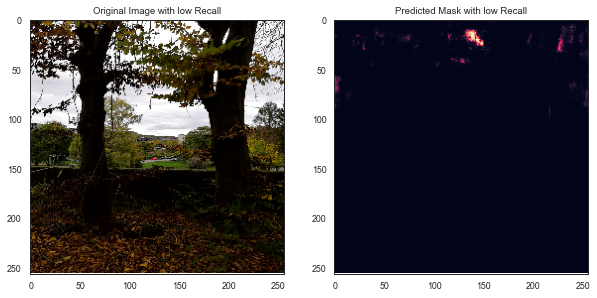

Recall:  0.012031516


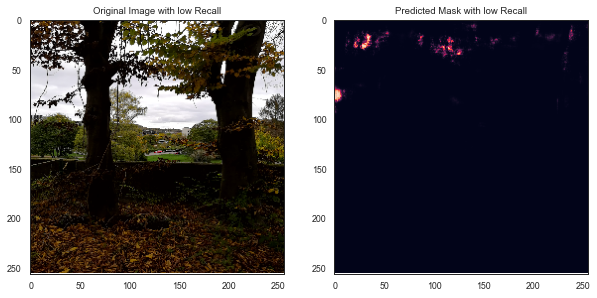

Recall:  0.039055265


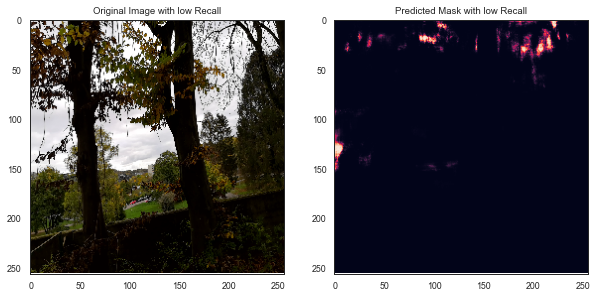

Recall:  0.018355945


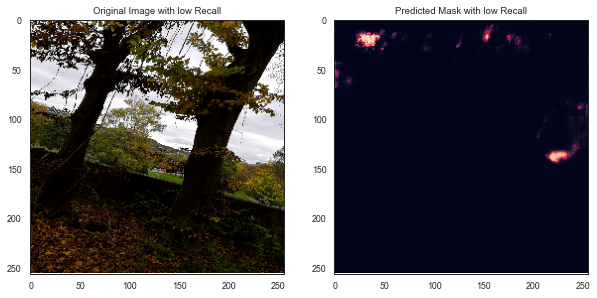

Recall:  0.112757266


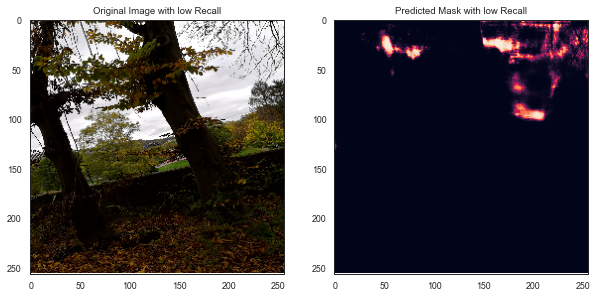

In [30]:
epoch = 10

#predict on a single image from the dataset after skipping 10 images
transfer_results = []
model = keras.models.load_model("models/model_30000_5_optimized.h5")

sns.set_style("white")
sns.set_context("paper", font_scale=1)

for image, label in bachelor_dataset:#.map(lambda x,y: (tf.expand_dims(x,axis=0), tf.expand_dims(y,axis=0))):
    #image = tf.expand_dims(image, axis=0)
    start = time.time()
    prediction = model.predict(image, verbose = 0) # remove first dimension of prediction tensor
    time_taken = time.time() - start

    #get the precision and recall
    precision = tf.keras.metrics.Precision()
    precision.update_state(label, prediction)
    recall = tf.keras.metrics.Recall()
    recall.update_state(label, prediction)

    #if precision and recall are less than 0.5, display the image
    if precision.result().numpy() < 0.2:
        print("Precision: ", precision.result().numpy())
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image[0])
        ax1.set_title('Original Image with low Precision')
        ax2.imshow(prediction[0])
        ax2.set_title('Predicted Mask with low Precision')
        plt.show()

    if recall.result().numpy() < 0.2:
        print("Recall: ", recall.result().numpy())
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        ax1.imshow(image[0])
        ax1.set_title('Original Image with low Recall')
        ax2.imshow(prediction[0])
        ax2.set_title('Predicted Mask with low Recall')
        plt.show()

    transfer_results.append([precision.result().numpy(), recall.result().numpy(), time_taken])
    #save results to csv with headers
np.savetxt("output\\analysis_data\\results_62_optimized.csv", transfer_results, delimiter=",", header="precision,recall,time_taken", comments="")

#### Plot of precision and recall for each image in the bachlor dataset

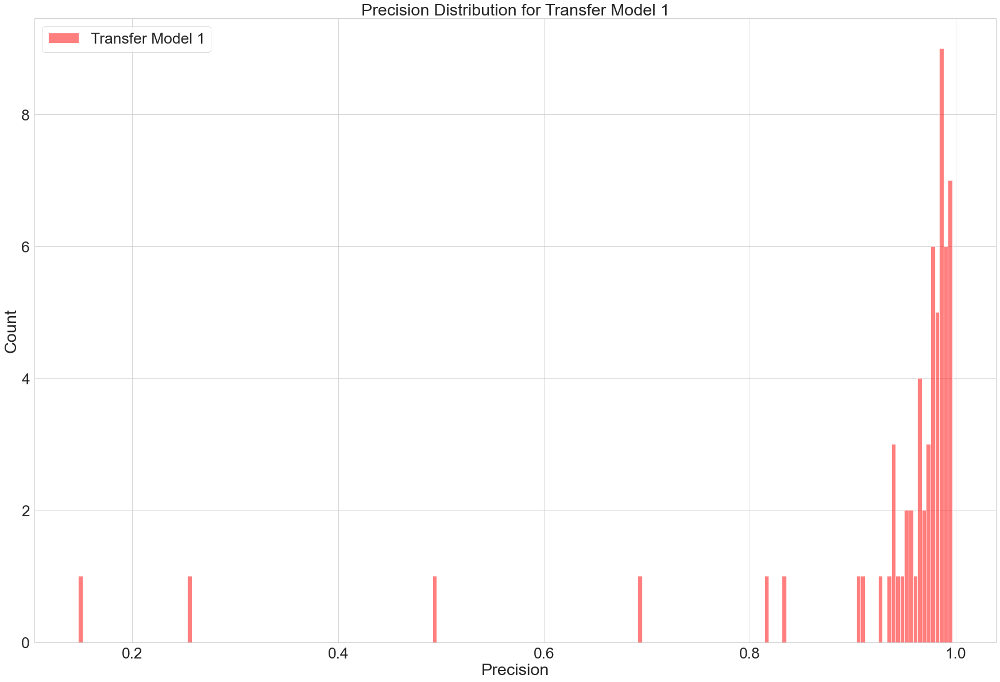

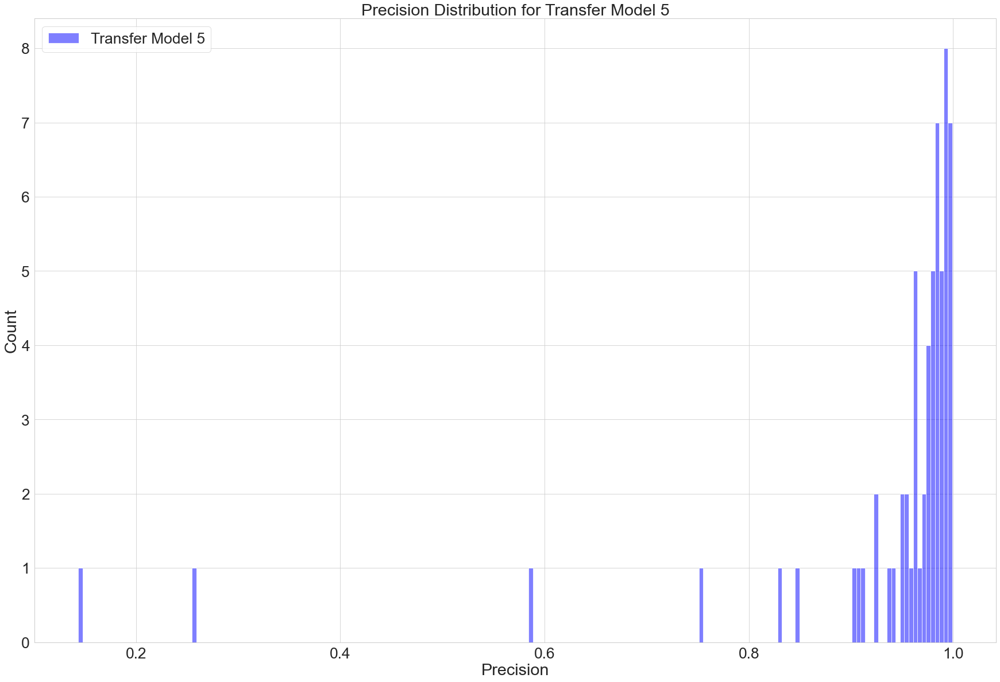

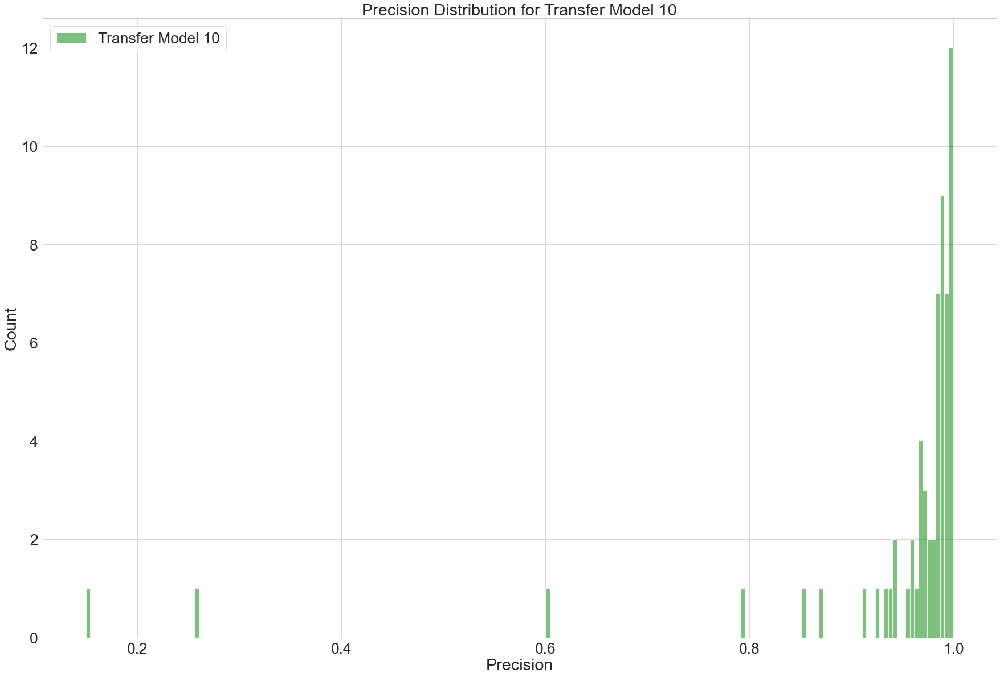

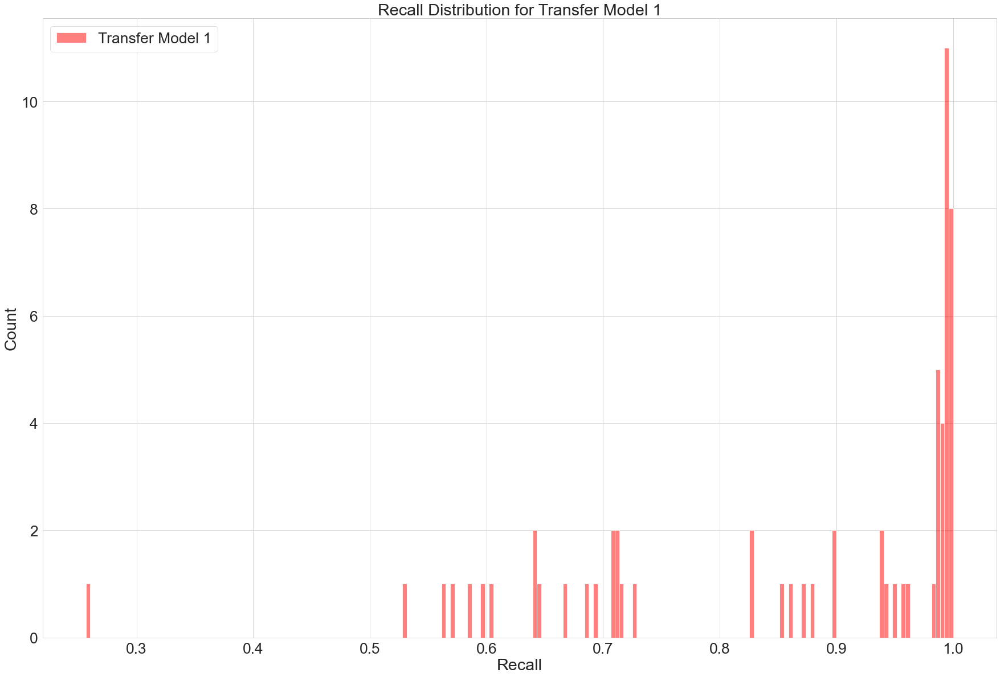

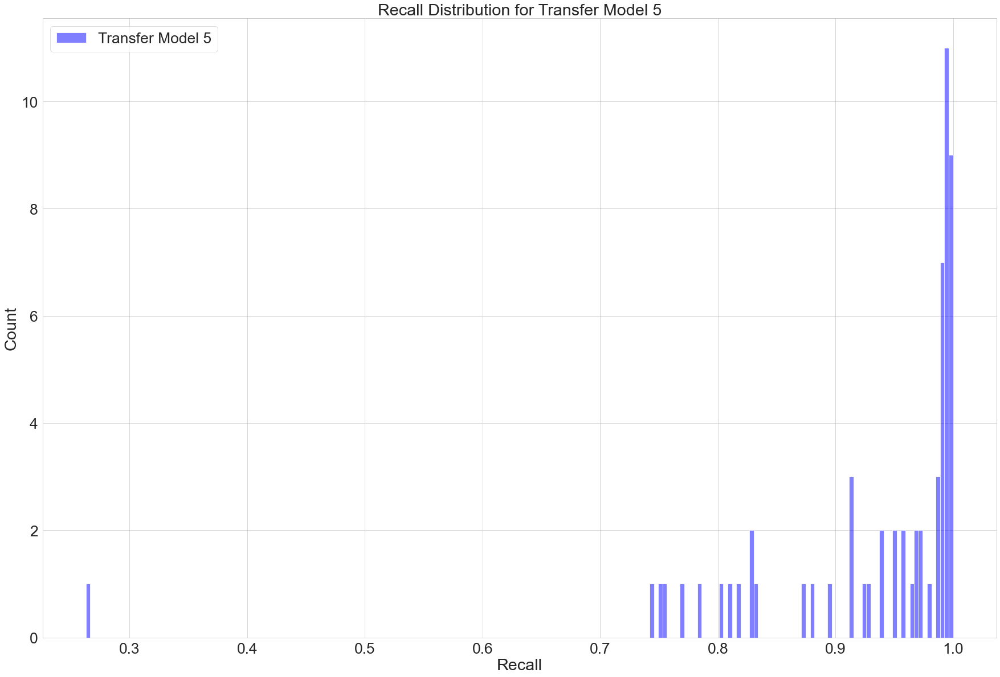

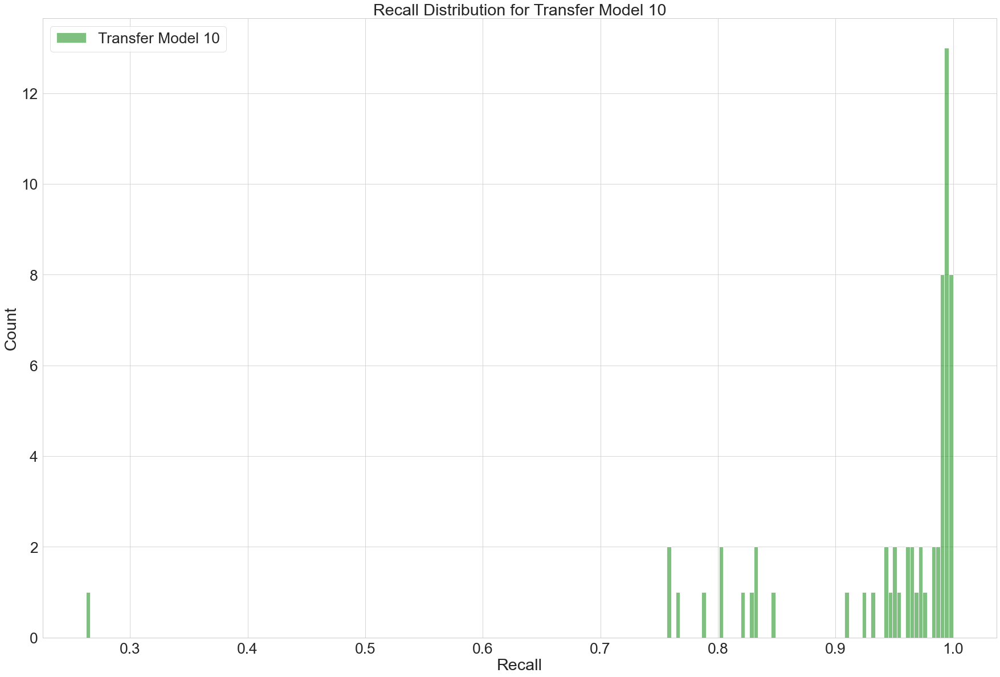

In [26]:
df1 = pd.read_csv("output\\analysis_data\\results_62_transfer_model_1.csv")
df2 = pd.read_csv("output\\analysis_data\\results_62_transfer_model_5.csv")
df3 = pd.read_csv("output\\analysis_data\\results_62_transfer_model_10.csv")

# Set the style for the plots
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=3)

# Create a figure with a single subplot for precision values
fig, ax = plt.subplots(figsize=(30, 20))

# Plot the distribution of precision values for df1 in red
sns.histplot(df1['precision'], ax=ax, color='red', alpha=0.5, label='Transfer Model 1', bins=200)

# Set the title and axis labels
ax.set_title("Precision Distribution for Transfer Model 1")
ax.set_xlabel("Precision")
ax.set_ylabel("Count")

# Add a legend
ax.legend()

# Display the plot
plt.show()

# Create a figure with a single subplot for precision values
fig, ax = plt.subplots(figsize=(30, 20))

# Plot the distribution of precision values for df2 in blue
sns.histplot(df2['precision'], ax=ax, color='blue', alpha=0.5, label='Transfer Model 5', bins=200)

# Set the title and axis labels
ax.set_title("Precision Distribution for Transfer Model 5")
ax.set_xlabel("Precision")
ax.set_ylabel("Count")

# Add a legend
ax.legend()

# Display the plot
plt.show()

# Create a figure with a single subplot for precision values
fig, ax = plt.subplots(figsize=(30, 20))

# Plot the distribution of precision values for df3 in green
sns.histplot(df3['precision'], ax=ax, color='green', alpha=0.5, label='Transfer Model 10', bins=200)

# Set the title and axis labels
ax.set_title("Precision Distribution for Transfer Model 10")
ax.set_xlabel("Precision")
ax.set_ylabel("Count")

# Add a legend
ax.legend()

# Display the plot
plt.show()

# Create a figure with a single subplot for recall values
fig, ax = plt.subplots(figsize=(30, 20))

# Plot the distribution of recall values for df1 in red
sns.histplot(df1['recall'], ax=ax, color='red', alpha=0.5, label='Transfer Model 1', bins=200)

# Set the title and axis labels
ax.set_title("Recall Distribution for Transfer Model 1")
ax.set_xlabel("Recall")
ax.set_ylabel("Count")

# Add a legend
ax.legend()

# Display the plot
plt.show()

# Create a figure with a single subplot for recall values
fig, ax = plt.subplots(figsize=(30, 20))

# Plot the distribution of recall values for df2 in blue
sns.histplot(df2['recall'], ax=ax, color='blue', alpha=0.5, label='Transfer Model 5', bins=200)

# Set the title and axis labels
ax.set_title("Recall Distribution for Transfer Model 5")
ax.set_xlabel("Recall")
ax.set_ylabel("Count")

# Add a legend
ax.legend()

# Display the plot
plt.show()

# Create a figure with a single subplot for recall values
fig, ax = plt.subplots(figsize=(30, 20))

# Plot the distribution of recall values for df3 in green
sns.histplot(df3['recall'], ax=ax, color='green', alpha=0.5, label='Transfer Model 10', bins=200)

# Set the title and axis labels
ax.set_title("Recall Distribution for Transfer Model 10")
ax.set_xlabel("Recall")
ax.set_ylabel("Count")

# Add a legend
ax.legend()

# Display the plot
plt.show()

#### Average Metrics for all Transfer Learning Models

In [27]:
print("Mean Precision for Transfer Model 1 Epoch:", df1['precision'].mean())
print("Mean Recall for Transfer Model 1 Epoch:", df1['recall'].mean())

Mean Precision for Transfer Model 1 Epoch: 0.9302437230944633
Mean Recall for Transfer Model 1 Epoch: 0.8607641285465609


In [28]:
print("Mean Precision for Transfer Model 5 Epochs: ", df2['precision'].mean())
print("Mean Recall for Transfer Model 5 Epochs: ", df2['recall'].mean())

Mean Precision for Transfer Model 5 Epochs:  0.9342081046873524
Mean Recall for Transfer Model 5 Epochs:  0.928840045486727


In [29]:
print("Mean Precision for Transfer Model 10 Epochs: ", df3['precision'].mean())
print("Mean Recall for Transfer Model 10 Epochs: ", df3['recall'].mean())

Mean Precision for Transfer Model 10 Epochs:  0.9416995019681992
Mean Recall for Transfer Model 10 Epochs:  0.9370368334554857


In [31]:
df4 = pd.read_csv("output\\analysis_data\\results_62_optimized.csv")
print("Mean Precision for Transfer Model 10 Epochs: ", df4['precision'].mean())
print("Mean Recall for Transfer Model 10 Epochs: ", df4['recall'].mean())

Mean Precision for Transfer Model 10 Epochs:  0.9253382230958631
Mean Recall for Transfer Model 10 Epochs:  0.6800665042152808


: 

### Prediction on Real-World Data

In [3]:
#choose image file
display(fc)

FileChooser(path='C:\Users\cjbla\OneDrive\Desktop\Code\data\dataset', filename='', title='', show_hidden=False…

In [4]:
#choose model file
display(model_file)

FileChooser(path='C:\Users\cjbla\OneDrive\Desktop\Code\masterthesis\models', filename='', title='', show_hidde…

In [9]:
#load the mdodel from models/model_13_04_2023.h5
model = keras.models.load_model(model_file.selected)

1/1 [==============================] - 1s 601ms/step


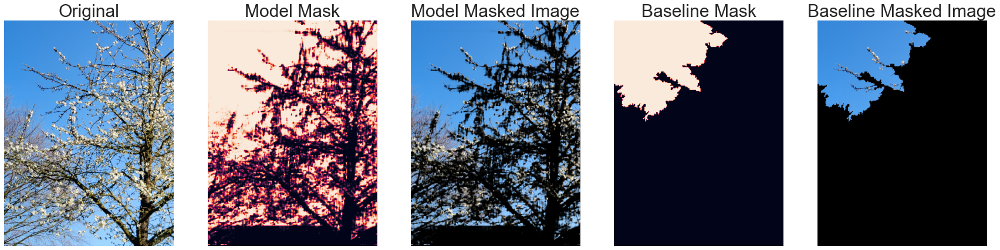

In [10]:
sns.set_style("white")
sns.set_context("paper", font_scale=1)

image = tf.io.read_file(fc.selected)
image = tf.image.decode_jpeg(image, channels=3)

#get the shape of the image
original_shape = image.shape
original = image

image = tf.image.resize(image, [256, 256], method='nearest')
if "segmented" in model_file.selected:  
    (image, _, _) = pms.segment(image, spatial_radius=2, range_radius=8, min_density=150)
image = tf.image.convert_image_dtype(image, tf.float32)
image = tf.expand_dims(image, axis=0)

mask_baseline, _, _ = baseline_mean_shift_third(plt.imread(fc.selected))
masked_baseline_image = cv2.bitwise_and(plt.imread(fc.selected), plt.imread(fc.selected), mask=mask_baseline)

original = tf.image.convert_image_dtype(original, tf.float32)
original = tf.expand_dims(original, axis=0)

#reshape the prediction to the original shape
prediction = model.predict(image)
prediction = tf.image.resize(prediction, [original_shape[0], original_shape[1]], method='nearest')

image_masked = original * prediction # type: ignore

#reshape the image to the original shape
image_masked = tf.image.resize(image_masked, [original_shape[0], original_shape[1]], method='nearest')

# Plot the first, third, and fourth images in the same plot
fig, axs = plt.subplots(1, 5, figsize=(30, 20))
axs[0].imshow(original[0])
axs[0].set_title("Original", fontsize=30)
axs[0].axis('off')
axs[1].imshow(prediction[0])
axs[1].set_title("Model Mask", fontsize=30)
axs[1].axis('off')
axs[2].imshow(image_masked[0])
axs[2].set_title("Model Masked Image", fontsize=30)
axs[2].axis('off')
axs[3].imshow(mask_baseline)
axs[3].set_title("Baseline Mask", fontsize=30)
axs[3].axis('off')
axs[4].imshow(masked_baseline_image)
axs[4].set_title("Baseline Masked Image", fontsize=30)
axs[4].axis('off')

# Display the plot
plt.show()

#### Visualizing the Model

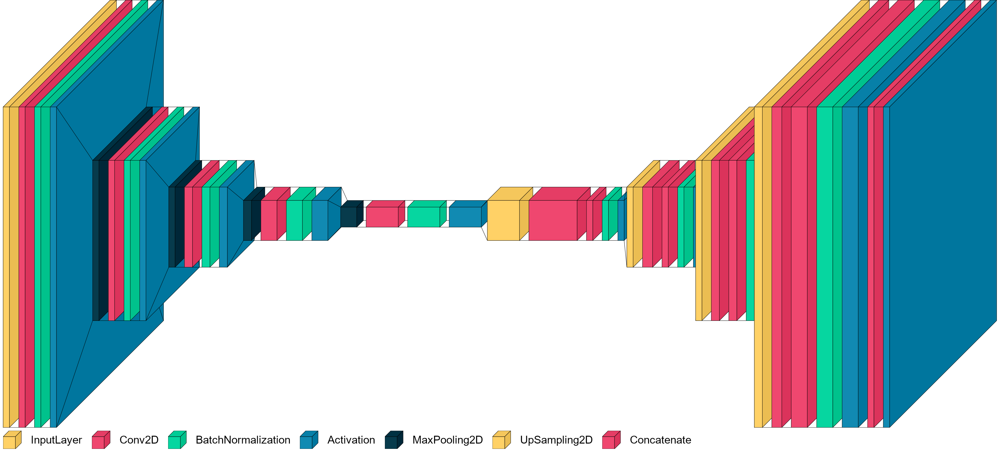

In [13]:
from keras.utils.vis_utils import plot_model
import visualkeras
from PIL import ImageFont

font = ImageFont.truetype("arial.ttf", 35)
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=False, expand_nested=True, show_layer_activations=False)
visualkeras.layered_view(model, legend=True,spacing=30, font=font)